# Keyword Search in Audio Files with Audio Input


<img src= "images/rabbit.webp" width = 200/>

# Set-up

## Importing necessary packages

Make sure that you created a new environment and then the cell below will install the necessary libraries for you.

In [2]:
import sys
!{sys.executable} -m pip install -r ../requirements.txt

  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6083 sha256=a6750b32d2eb0b78e41c68280fa99e14f36ad99e578502970b228aacff9e8b23
  Stored in directory: /Users/mguner/Library/Caches/pip/wheels/64/80/6e/caa3e16deb0267c3cbfd36862058a724144e19fdb9eb03af0f
Successfully built ffmpeg


# Description about the problem

<img src = 'images/alice_up.jpg' width = 250/>

## Introduction and Overview

__Audio Books__


<img src= 'images/sapiens.jpeg' width = 350/>


In 2019, in US the audiobook sales were $1.2B with a 25% increase from the previous year. [source](https://goodereader.com/blog/audiobooks/audiobook-trends-and-statistics-for-2020) And it's expected to grow in the following years. With more users prefer audiobooks the technology will add new features to their apps to increase customer satisfaction and to attract more listeners. [source](https://www2.deloitte.com/us/en/insights/industry/technology/technology-media-and-telecom-predictions/2020/rise-of-audiobooks-podcast-industry.html)

__Goal of this project__

In this project, we would like to add an audio-keyword search within a given audiobook. For example, let's say you are listening _Alica in Wonderland_ and you would like to jump to the part of the audiobook where _Alice_ saw _the white rabbit_ for the first time. With our app you will be able say `white rabbit` and the app will find the places where the keyword `white rabbit` take place.

__Steps__

This project involves the following steps:
    
1. Downloading the audio file from a given url
2. Converting .mp3 format to .wav which is more native to work with audio files.
3. Detecting silences and speech. 
    - We divided the whole audiobook into smaller chunks to be able to make the keyword search easier. We used `pydub` library for this purpose.
    - In addition to dividing the audio file into utterances we need to be able to record their corresponding timestamp in the original file. 
4. After we divide the audio file into smaller chunks we use `speech_recognition` library to convert this audio chunks to text. 
5. Take the audio keyword input from the user. Again we used `microphone` module of `speech_recognition` library to be able to get the input from users computer.
6. After converting the audio keyword to text, we used `fuzzywuzzy` library for text matching. 

Below we will explain these steps in more depth.

# Get the first chapter of audio book and save the file

In this cell, from a given url we will download the audio book. 

In [1]:
import requests
import  os


## These audio_books are in the public domain
url = 'https://ia800503.us.archive.org/3/items/alices_adventures/aliceinwonderland_01_carroll.mp3'
r = requests.get(url, allow_redirects=True)

try: 
    os.mkdir('data') 
except(FileExistsError): 
    pass

## we save the zip_file in our directory
open('data/aliceinwonderland_01_carroll.mp3', 'wb').write(r.content)

7076174

Let's hear the first chapter of `Alice in Wonderland`

In [2]:
#Ipython package has a easy tool for playing audio files.
import IPython.display as ipd
ipd.Audio('data/aliceinwonderland_01_carroll.mp3') # load a local WAV fil

- You can also download all the chapters - It takes a little bit longer. The cell below will download all the chapters of `Alice in Wonderland` audio book. Depending on the internet speed it should take approximately 1 minutes.

In [3]:
## These audio_books are in the public domain
url = 'http://www.archive.org/download/alices_adventures/alices_adventures_64kb_mp3.zip'
r = requests.get(url, allow_redirects=True)

try: 
    os.mkdir('data') 
except(FileExistsError): 
    pass


## we save the zip_file in our directory
open('data/Aliceinwonderland.zip', 'wb').write(r.content)

## Extracting the zip_files

# importing required modules 
from zipfile import ZipFile 

# specifying the zip file name 
file_name = "data/Aliceinwonderland.zip"

# opening the zip file in READ mode 
with ZipFile(file_name, 'r') as zipfile: 
    # printing all the contents of the zip file 
    zipfile.printdir() 

    # extracting all the files 
    print('Extracting all the files now...') 
    zipfile.extractall(path = 'data/Alice/') 
    print('Done!') 


File Name                                             Modified             Size
aliceinwonderland_01_carroll_64kb.mp3          2007-05-19 00:31:06      3538287
aliceinwonderland_02_carroll_64kb.mp3          2007-05-19 00:32:44      3086679
aliceinwonderland_03_carroll_64kb.mp3          2007-05-19 00:32:30      3286894
aliceinwonderland_04_carroll_64kb.mp3          2007-05-19 00:32:08      3569020
aliceinwonderland_05_carroll_64kb.mp3          2007-05-19 00:31:20      3142903
aliceinwonderland_06_carroll_64kb.mp3          2007-05-19 00:31:32      2640087
aliceinwonderland_07_carroll_64kb.mp3          2007-05-19 00:31:54      1746909
aliceinwonderland_08_carroll_64kb.mp3          2007-05-19 00:31:46      3518858
aliceinwonderland_09_carroll_64kb.mp3          2007-05-19 00:32:16      1794561
aliceinwonderland_10_carroll_64kb.mp3          2007-05-19 00:32:52      1827576
Extracting all the files now...
Done!


# Understanding audio files

to be able to work with audio files we used [pydub library](http://pydub.com/). This library allow us to slice audio files, divide the file into utterances and detecting silences etc. Below you will see that, we slice an audio file.

In [4]:
from pydub import AudioSegment
from pydub.playback import play
import matplotlib.pyplot as plt
from scipy.io import wavfile
from tempfile import mktemp
path = 'data/Alice/aliceinwonderland_03_carroll_64kb.mp3'


alice = AudioSegment.from_mp3(path)
## Change start and end indices to get different spectograms

start = 40*1000

end = 46*1000


alice_part = alice[start:end]
wname = mktemp('.wav')  # use temporary file
alice_part.export(wname, format="wav")  # convert to wav
FS, data = wavfile.read(wname)  # read wav file
alice_part

Audio format is an interesting format to work with. Note that an audio data is a continuous data so how to represent this format in computers is a question. There are alternative ways to represent an audio file but in this project we let the pydub handle this problem for us. 

Below you will see a representation of the file that we just played above. 

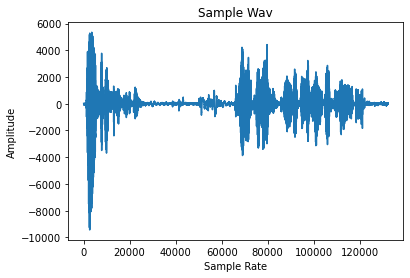

In [5]:
plt.plot(data)
# label the axes
plt.ylabel("Amplitude")
plt.xlabel("Sample Rate")
# set the title  
plt.title("Sample Wav")
# display the plot
plt.show()

# Dividing a chapter into chunks and indexing


In this section we will use SpeechRecognition and Pydub packages for splitting data into chunks and converting chunks to text.

<img src = "images/announcement.jpg" width = 250/>

## Options for creating chunks: Uniform Chunks

- Note that if we split audio data with a uniform length then it might interrupt the talk. Let's try 9 second  and 37 second.

In [6]:
from pydub import AudioSegment
import speech_recognition as sr
import time

path = 'data/Alice/aliceinwonderland_03_carroll_64kb.mp3'

song = AudioSegment.from_mp3(path)[5*1000: 9*1000]

# let's hear the audipart again
play(song)

audio =sr.AudioData(song.raw_data, sample_rate= song.frame_rate, sample_width= song.frame_width) 

## instantiate a recognizer object
r = sr.Recognizer()

r.recognize_google(audio)

'the Box recording all LibriVox recordings are in the pub'

> "...SpeechRecognition ships with a default API key for the Google Web Speech API, you can get started with it right away..."

> "__Caution:__ The default key provided by SpeechRecognition is for testing purposes only, and Google may revoke it at any time. It is not a good idea to use the Google Web Speech API in production..."

For more on API key check: [RealPython.com](https://realpython.com/python-speech-recognition/#the-effect-of-noise-on-speech-recognition)

## Dividing audio into chunks from silence

The basic idea, in our execution of this project is to dividing audio files into smaller chunks from the utterances and keep recording their timestamps in the original audio file. Below you will see a very quick implementation of this idea. 

The code below, first listens the chapter-3 of the audio book and then divide it into smaller chunks from the pauses in the speech. 

The function `silence_based_conversion` is defined and provided in `notebooks` directory. In the actual code we implemented a very similar code but with a slightly different processes. 

In [12]:
from silence_based_conversion import silence_based_conversion

path = 'data/Alice/aliceinwonderland_03_carroll_64kb.mp3'

# let's put an start and end time here. Otherwise it takes too long (~ 4 min).
start = '-'
end = '-'
extracted_text = silence_based_conversion(path, 
                                          min_silence_len= 750,
                                          silence_thresh= -40 ,
                                          pad = 300,
                                          start = start, end=end) 

extracted_text

saving chunk0.wav
saving chunk1.wav
saving chunk2.wav
saving chunk3.wav
saving chunk4.wav
saving chunk5.wav
saving chunk6.wav
Could not understand audio
saving chunk7.wav
saving chunk8.wav
saving chunk9.wav
saving chunk10.wav
saving chunk11.wav
saving chunk12.wav
saving chunk13.wav
saving chunk14.wav
saving chunk15.wav
saving chunk16.wav
saving chunk17.wav
saving chunk18.wav
saving chunk19.wav
saving chunk20.wav
saving chunk21.wav
saving chunk22.wav
Could not understand audio
saving chunk23.wav
saving chunk24.wav
saving chunk25.wav
saving chunk26.wav
saving chunk27.wav
saving chunk28.wav
saving chunk29.wav
saving chunk30.wav
saving chunk31.wav
saving chunk32.wav
saving chunk33.wav
saving chunk34.wav
saving chunk35.wav
saving chunk36.wav
Could not understand audio
saving chunk37.wav
saving chunk38.wav
Could not understand audio
saving chunk39.wav
saving chunk40.wav
saving chunk41.wav
saving chunk42.wav
saving chunk43.wav
saving chunk44.wav
saving chunk45.wav
Could not understand audio
s

[(0, [0, 2621], "Chapter 3 of Alice's Adventures in"),
 (1, [4397, 5407], 'this is a LibriVox for'),
 (2, [7110, 8370], 'LibriVox recordings are in'),
 (3, [10313, 10722], 'for more information'),
 (4, [11807, 11880], 'orthodontist'),
 (5, [13143, 13264], 'is it'),
 (7, [16282, 16801], 'recorded by Q'),
 (8, [18727, 19622], "Alice's Adventures in"),
 (9, [20856, 21169], 'by Lewis'),
 (10, [22575, 22612], 'chapter'),
 (11, [24038, 25378], 'a caucus-race and a long'),
 (12,
  [27667, 30287],
  'they were indeed a queer looking party that is simple.'),
 (13,
  [31705, 36112],
  'the birds with dragold feathers the animals with their fur clinging close to'),
 (14, [37134, 40431], 'and all dripping wet cross and'),
 (15, [43108, 44889], 'first question of course was how to get dry'),
 (16,
  [46294, 53286],
  'they had a consultation about this and after a few minutes it seemed quite natural to Alice to find herself talking familiar'),
 (17, [54613, 55857], 'as if she had known them all her

As you see above in addition to dividing audio into smaller pieces, we converted them to text and record their timestamps. Timestamps are in milliseconds.

# Keyword match with FuzzyWuzzy

<img src = "images/alice_dive.png" width =300/>

Now for a given keyword we can match the text and chunk. However, we would like to match the text and the keyword in a flexible manner. This is why we used the `fuzzywuzzy` library. With this library, we can find not only exact matches but also partial string matched by using Levenshtein metric type similarity measures. For more information you can check the [documentation](https://pypi.org/project/fuzzywuzzy/). 

In [16]:
from fuzzywuzzy import fuzz
from pydub.playback import play

for (i, interval,sentence) in extracted_text:
    score = fuzz.token_set_ratio('Alice', sentence)
    if score > 95: 
        print('Text Found:\n' ,sentence)
        song = AudioSegment.from_mp3(path)
        play(song[interval[0]:interval[1]])
        q = input("Press enter to quit or a number to listen next match: ")
        if q:
            continue
        else:
            print('Ending search')
            break
print('End of the list')

Text Found:
 Chapter 3 of Alice's Adventures in
Press enter to quit or a number to listen next match: 3
Text Found:
 Alice's Adventures in
Press enter to quit or a number to listen next match: 3
Text Found:
 they had a consultation about this and after a few minutes it seemed quite natural to Alice to find herself talking familiar
Press enter to quit or a number to listen next match: 
Ending search
End of the list


# Taking input keyword from the microphone

__Oh my ears and whiskers, how late it’s getting!__

<img src = 'images/rabbit_time.png' width = 200 />

Below we put together different parts we have developed so far. 

First we will activate the microphone in your device

Second, we will get a keyword from the user

Finally we will match the keyword and the audio file. Then we will play the relevant part to make sure that this is exactly the part we were looking for in the audio file. If the user would like to listen other matches they can use the 'next' voice command. If the user is satisfied with the match then they should use 'stop' voice command. In this case audio book will be played from the beginning of the last match. 

In [24]:
import random
import time
from fuzzywuzzy import fuzz
from listen import recognize_speech_from_mic

# create recognizer and mic instances
recognizer = sr.Recognizer()
microphone = sr.Microphone()
PROMPT_LIMIT = 2

# format the instructions string
instructions = (
    "Give me a keyword to search in Alice in Wonderland")

# show instructions
print(instructions)

alice = AudioSegment.from_mp3(path)


for j in range(PROMPT_LIMIT):
    print('Attempt_{} Which keyword do you want to search? Speak after the command'.format(j))
    #after the question wait a sec
    time.sleep(1)
    print("Speak the word now!")
    keyword = recognize_speech_from_mic()
    if keyword["transcription"]:
        break
    if not keyword["success"]:
        break
    print("I didn't catch that. What did you say?\n")  
print("You Said:", keyword['transcription'])


results = []
for (i, interval,sentence) in extracted_text:
    score = fuzz.token_set_ratio(keyword['transcription'], sentence)
    if score > 95: 
        results.append((i, interval, sentence))
        
print('{} results found\n'.format(len(results)))


for i, interval, sentence in results:
    play(alice[interval[0]:interval[1]])

    
    for j in range(PROMPT_LIMIT):
        print('Do you want to hear next? Say next, continue or stop')        #after the question wait a sec
        time.sleep(1)
        
        recognizer = sr.Recognizer()
        microphone = sr.Microphone()
        print("Speak the word now!")
        gate = recognize_speech_from_mic()
        
        if gate["transcription"]:
            break
        if not gate["success"]:
            break
        print("I didn't catch that. What did you say?\n")  
    print("you said {}".format(gate['transcription']))
    if gate['transcription'].lower() == 'next':
        continue
    elif gate['transcription'].lower() == 'continue':
        play(alice[interval[1]-5*1000: interval[1]+5*1000])
        break
    else:
        gate['transcription'].lower() == 'stop'
        print("program exits")
        break
print("End of the matched list")


Give me a keyword to search in Alice in Wonderland
Attempt_0 Which keyword do you want to search? Speak after the command
Speak the word now!
Mic is on
I didn't catch that. What did you say?

Attempt_1 Which keyword do you want to search? Speak after the command
Speak the word now!
Mic is on
I didn't catch that. What did you say?

You Said: None
0 results found

End of the matched list


# Resources:



[Speech Recognition](https://pypi.org/project/SpeechRecognition/)

[For taking the input from microphone](https://github.com/realpython/python-speech-recognition/blob/master/guessing_game.py)

[For the silence detection](https://github.com/jiaaro/pydub/blob/master/pydub/silence.py)

[For keyword matching with the text](https://pypi.org/project/fuzzywuzzy/)

[Alice in Wonderland Text](https://www.gutenberg.org/files/11/11-h/11-h.htm#chap01)

[Alice in Wonderland Audiobook](https://archive.org/details/alices_adventures)

[Ipython Display - Audio](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html)

# Extras

## Decibels vs dBFS

[Decibels vs Full scale decibels](https://www.audiomasterclass.com/newsletter/what-is-the-difference-between-0-db-and-0-dbfs)

[Different decibel levels](https://www.youtube.com/watch?v=1XUovxiTpVA)

[Another short video on dBFS](https://www.youtube.com/watch?v=Aa1qh3xwc8w)

## Audio data with Python

- There are several packages in python that allow us to work with audio format. For the future references, I add these here.

- [Scipy - Wav files](https://docs.scipy.org/doc/scipy/reference/io.html) With Scipy we can read and write audio files. 

- [Pydub](https://pypi.org/project/pydub/): Manipulate audio with an simple and easy high level interface. We will use pydub for finding silent parts of the audio.

- [Pyaudio](https://pypi.org/project/PyAudio/): the cross-platform audio input/output stream library. We will use pyaudio to access microphone.

- [Librosa](https://librosa.github.io/librosa/index.html): For music and audio analysis. We will use librosa for visualization purposes.

- [Python-Wiki](https://wiki.python.org/moin/Audio)

## Using scipy for spectograms

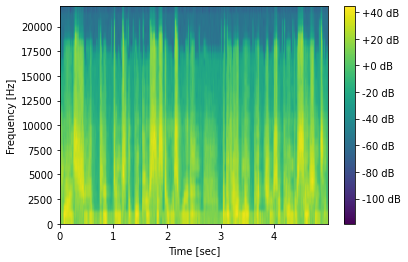

In [4]:
from pydub import AudioSegment
from pydub.playback import play
import matplotlib.pyplot as plt
from scipy.io import wavfile
from tempfile import mktemp

## Change start and end indices to get different spectograms
alice = AudioSegment.from_mp3('data/aliceinwonderland_01_carroll.mp3')[35000:40000]
wname = mktemp('.wav')  # use temporary file
alice.export(wname, format="wav")  # convert to wav
FS, data = wavfile.read(wname)  # read wav file

plt.specgram(data, Fs=FS, NFFT=64, noverlap=0)  # plot
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar(format='%+2.0f dB')

plt.show()

## Using Librosa

/Users/muratguner/Documents/experiments/meet_up_presentation/ispeech/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


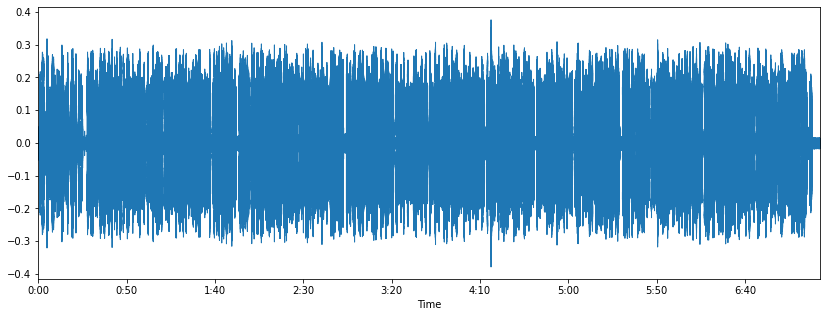

In [49]:
import librosa

%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

# sr for sample_rate
x, sr = librosa.load('data/aliceinwonderland_01_carroll.mp3')

plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

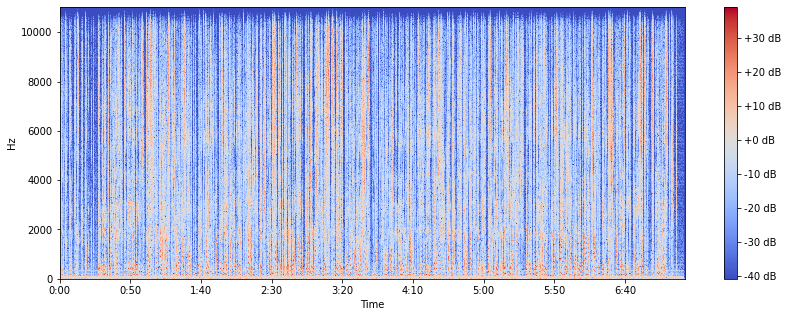

In [52]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.show()

## Speech Recognition with Google API

In [102]:
from google.cloud import speech_v1
from google.cloud.speech_v1 import enums
import io
from google.oauth2 import service_account


def sample_long_running_recognize(local_path):
    """
    Print start and end time of each word spoken in audio file from local.

    Args:
      Local_path e.g. "audio_chunks/chunk20.wav" Audio file shouldn't be bigger than a minute.
    """
    
    
    credentials = service_account.Credentials.from_service_account_file('google_credentials.json')


    client = speech_v1.SpeechClient(credentials=credentials)

    # When enable_word_time_offsets == True, the first result returned by the API will include a list
    # of words and the start and end time offsets (timestamps) for those words.
    enable_word_time_offsets = True

    # The language of the supplied audio
    language_code = "en-US"
    config = {
        "enable_word_time_offsets": enable_word_time_offsets,
        "language_code": language_code,
    }

    with io.open(local_path, "rb") as f:
        content = f.read()
        
    # audio should be in dictionary format.
    audio = {"content": content}


    operation = client.long_running_recognize(config, audio)

    print(u"Waiting for operation to complete...")
    response = operation.result()
#     print(response)
    # The first result includes start and end time word offsets
    result = response.results[0]
    # First alternative is the most probable result
    alternative = result.alternatives[0]
    print(alternative.transcript, alternative.words[1].start_time.seconds ,alternative.words[-1].end_time.seconds)

local_file_path = "audio_chunks/chunk20.wav"
sample_long_running_recognize(local_file_path)


Waiting for operation to complete...
I hope they'll remember her saucer of milk at tea-time Dynamite Arrow wish you were down here with me 0 5


## Some articles on audio books


- [Deloitte Predicts: Audio Book Industry to reach US$3.5 Billion in 2020](https://www2.deloitte.com/us/en/insights/industry/technology/technology-media-and-telecom-predictions/2020/rise-of-audiobooks-podcast-industry.html)

<img src = 'images/trends_in_books.png' width = 500/>

[Images Source](https://www.cybercultural.com/p/audiobooks-deep-dive-latest-statistics)



In [3]:
import pickle

In [4]:
with open('/Users/mguner/Documents/personal/Experiments/audio_search/data/audio_chunks/aliceinwonderland_08_carroll_64kb/ranges.obj', 'rb') as file:
    a = pickle.load(file)
a

EOFError: Ran out of input